### SLX Model Estimated via Bambi

The following notebook illustrates how to estimate the Spatial Lag of X model in Bambi. The spatial lag of X model (hereafter SLX) can be mathematically defined as follows:

$$
y = X\beta + WX \theta + \varepsilon
$$

The SLX model is a standard linear regression model but with an augumented explanatory variable matrix that consists of spatially weighted explanatory variables. 

The W term in the above equation is referred to as a spatial weight matrix and represents the connectivity of the observations in space, with the diagonal elements set to zero. In this notebook, a five nearest neighbors spatial weigt matrix is used for demonstration purposes. A defining characteristic of the spatial weight matrix is that it is row standardized, which means that the sum of the rows of the spatial weight matrix is equal to 1.

The coefficients represented by $\beta$ are the direct effects, and measure how a change in an explanatory variable at location $i$ affects the dependent variable at location $i$. This is known as the direct effect of an explantory variable on the dependent variable.

Also notice that in the above equation that the explanatory variable matrix is pre-multiplied by the spatial weight matrix. These variables represent the average of the surrounding explanatory variables, and the coefficients on these variables represent spillover effects. In terms of interpretation, these $\theta$ coefficients represent how a change in an explanatory variable at location $i$ affects the dependent variable in location $j$, where $i \ne j$. Finaly, the total effects are the sum of the direct and indirect effects.

For a more comprehensive explanation of the SLX model please see the following reference:

Halleck Vega, Solmaria, and J. Paul Elhorst. "The SLX model." Journal of Regional Science 55, no. 3 (2015): 339-363.

#### Import the required packages

In [24]:
import arviz as az
import bambi as bmb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pysal.lib import weights
plt.style.use('arviz-doc')


#### Create random explanatory data and random geographic data for building the spatial weight matrix $W$

In [25]:
# Set random seed for reproducibility
np.random.seed(42)

# Create fake data
n = 3143  # Number of observations for approximate US counties

# Generate random independent variables
x1 = np.random.normal(0, 1, n)
x2 = np.random.normal(0, 1, n)
x3 = np.random.normal(0, 1, n)

# Generate random latitude and longitude values
# Based on a rough bounding box for the continental US
latitudes = np.random.uniform(25, 50, n)
longitudes = np.random.uniform(-67, -125, n)

# Combine into a DataFrame
data = pd.DataFrame({
    'x1': x1,
    'x2': x2,
    'x3': x3,
    'latitude': latitudes,
    'longitude': longitudes
})

# Create k-nearest neighbors spatial weights matrix using PySAL
k = 5  # Number of neighbors
coordinates = list(zip(data['latitude'], data['longitude']))
w = weights.KNN(coordinates, k=k)

# Normalize the weights matrix (row-standardization)
w.transform = 'R'

# Generate spatially weighted variables
data['wx1'] = weights.spatial_lag.lag_spatial(w, data['x1'])
data['wx2'] = weights.spatial_lag.lag_spatial(w, data['x2'])
data['wx3'] = weights.spatial_lag.lag_spatial(w, data['x3'])


#### Plot the KNN spatial weight matrix with 5 nearet neighbors

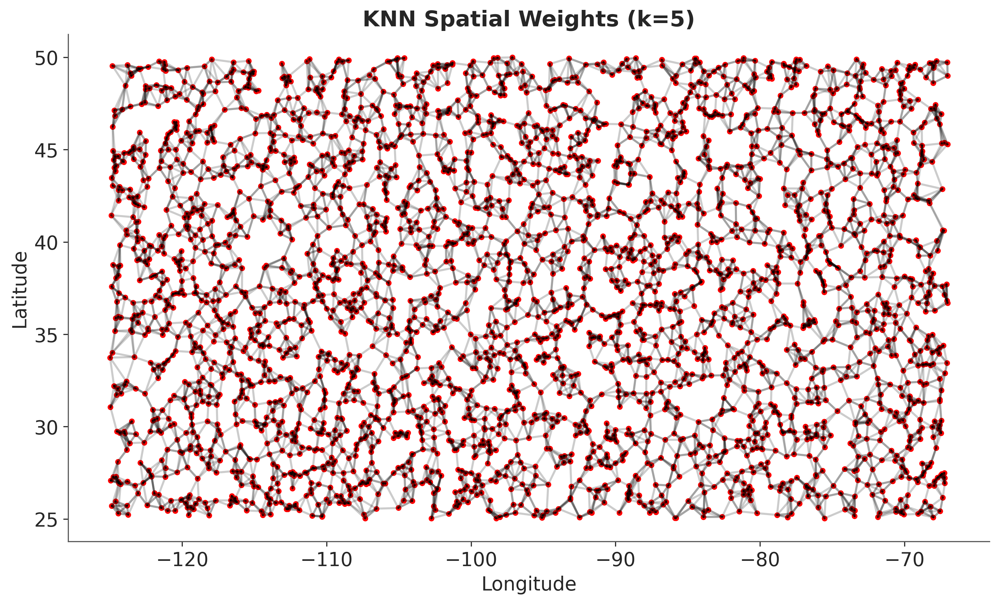

In [26]:
# Plot the KNN matrix
plt.figure(figsize=(10, 6))
for i, neighbors in w.neighbors.items():
    for neighbor in neighbors:
        plt.plot(
            [coordinates[i][1], coordinates[neighbor][1]],  # Longitude
            [coordinates[i][0], coordinates[neighbor][0]],  # Latitude
            'k-', alpha=0.2  # Black lines with transparency
        )

# Add scatter plot of points
plt.scatter(
    [coord[1] for coord in coordinates],  # Longitude
    [coord[0] for coord in coordinates],  # Latitude
    c='red', s=10, label='Points'
)

plt.title(f"KNN Spatial Weights (k={k})")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

#### Generate fake data for the regression model

In [27]:
# Define coefficients for the explanatory variables and the intercept
beta_0 = 2.0  # Intercept
beta_x1 = 1.5
beta_x2 = -2.0
beta_x3 = 0.5
beta_wx1 = 1.0
beta_wx2 = -1.5
beta_wx3 = 0.8

# Generate random noise
epsilon = np.random.normal(0, 1, n)

# Create the dependent variable
data['y'] = (
    beta_0 +  # Intercept
    beta_x1 * data['x1'] +
    beta_x2 * data['x2'] +
    beta_x3 * data['x3'] +
    beta_wx1 * data['wx1'] +
    beta_wx2 * data['wx2'] +
    beta_wx3 * data['wx3'] +
    epsilon
)

# Display the first few rows of the DataFrame
data.head()


,x1,x2,x3,latitude,longitude,wx1,wx2,wx3,y
0,0.496714,-0.602821,-1.040199,46.943959,-75.530054,0.500360,-0.709365,-0.346386,6.744730
1,-0.138264,0.432263,0.698816,27.500792,-111.395069,0.041521,0.544500,-0.092674,0.000283
2,0.647689,0.470044,1.448820,31.443502,-110.165645,-0.007985,-0.841584,-0.264837,5.801322
3,1.523030,-0.707626,-0.315082,43.794974,-119.393779,-0.525651,0.142616,-0.868688,3.667405
4,-0.234153,-0.712174,-0.241431,27.374666,-67.492189,0.032306,0.849134,0.346005,1.179548


#### Create the Bambi model and print

In [28]:
# Create the formula for the regression model
formula = "y ~ x1 + x2 + x3 + wx1 + wx2 + wx3"

# Create a model instance and print the model
model = bmb.Model(formula, data)
print(model)

       Formula: y ~ x1 + x2 + x3 + wx1 + wx2 + wx3
        Family: gaussian
          Link: mu = identity
  Observations: 3143
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 2.206, sigma: 7.2382)
            x1 ~ Normal(mu: 0.0, sigma: 7.2847)
            x2 ~ Normal(mu: 0.0, sigma: 7.1498)
            x3 ~ Normal(mu: 0.0, sigma: 7.0417)
            wx1 ~ Normal(mu: 0.0, sigma: 16.6486)
            wx2 ~ Normal(mu: 0.0, sigma: 16.028)
            wx3 ~ Normal(mu: 0.0, sigma: 15.7628)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.8774)


#### Estimate the model

In [29]:
results = model.fit(draws=5000, chains=10, target_accept=0.95)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sigma, Intercept, x1, x2, x3, wx1, wx2, wx3]


Output()

Sampling 10 chains for 1_000 tune and 5_000 draw iterations (10_000 + 50_000 draws total) took 11 seconds.


#### Extract the posterior samples so that we can calculate the total effects, which are the sum of the direct and indirect effects and print out the summary statistics.

In [30]:
# Extract posterior samples for x1, wx1, x2, wx2, x3, and wx3
posterior = results.posterior
x1_samples = posterior["x1"]
wx1_samples = posterior["wx1"]
x2_samples = posterior["x2"]
wx2_samples = posterior["wx2"]
x3_samples = posterior["x3"]
wx3_samples = posterior["wx3"]

# Compute the sums
total_x1 = x1_samples + wx1_samples
total_x2 = x2_samples + wx2_samples
total_x3 = x3_samples + wx3_samples

# Add the sums to the posterior as new variables
posterior = posterior.assign(
    total_x1=total_x1,
    total_x2=total_x2,
    total_x3=total_x3
)

# Update the results object with the modified posterior
results.posterior = posterior

# Display the updated summary
az.summary(results, hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,1.008,0.013,0.983,1.033,0.0,0.0,81774.0,37135.0,1.0
Intercept,2.025,0.018,1.990,2.061,0.0,0.0,92492.0,39279.0,1.0
x1,1.484,0.018,1.448,1.519,0.0,0.0,83308.0,38663.0,1.0
x2,-2.008,0.018,-2.043,-1.973,0.0,0.0,81534.0,38858.0,1.0
x3,0.507,0.018,0.472,0.542,0.0,0.0,89634.0,38728.0,1.0
wx1,1.002,0.042,0.921,1.082,0.0,0.0,82627.0,40056.0,1.0
wx2,-1.491,0.040,-1.569,-1.413,0.0,0.0,78193.0,39658.0,1.0
wx3,0.781,0.040,0.703,0.859,0.0,0.0,76809.0,39266.0,1.0
total_x1,2.486,0.046,2.394,2.575,0.0,0.0,77584.0,37888.0,1.0
total_x2,-3.499,0.043,-3.585,-3.415,0.0,0.0,81608.0,39596.0,1.0


#### Perform a trace plot to examine convergance

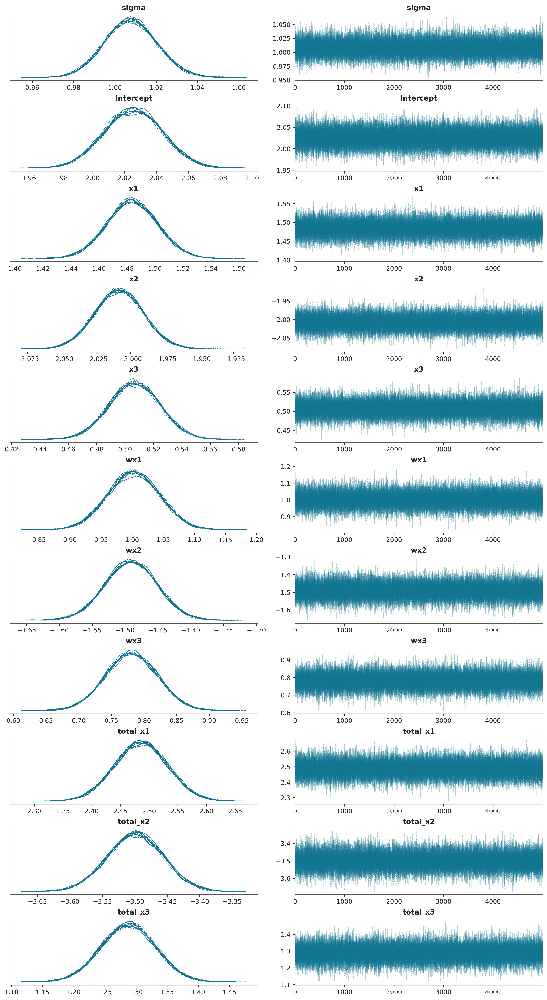

In [31]:
az.plot_trace(results);

#### Plot the posterior distributions with 95% credible intervals

In [32]:
az.plot_posterior(results, var_names=["x1", "x2", "x3", "wx1", "wx2", "wx3", "total_x1", "total_x2", "total_x3"], hdi_prob=0.95, round_to=4);

#### Plot posterior predictive density

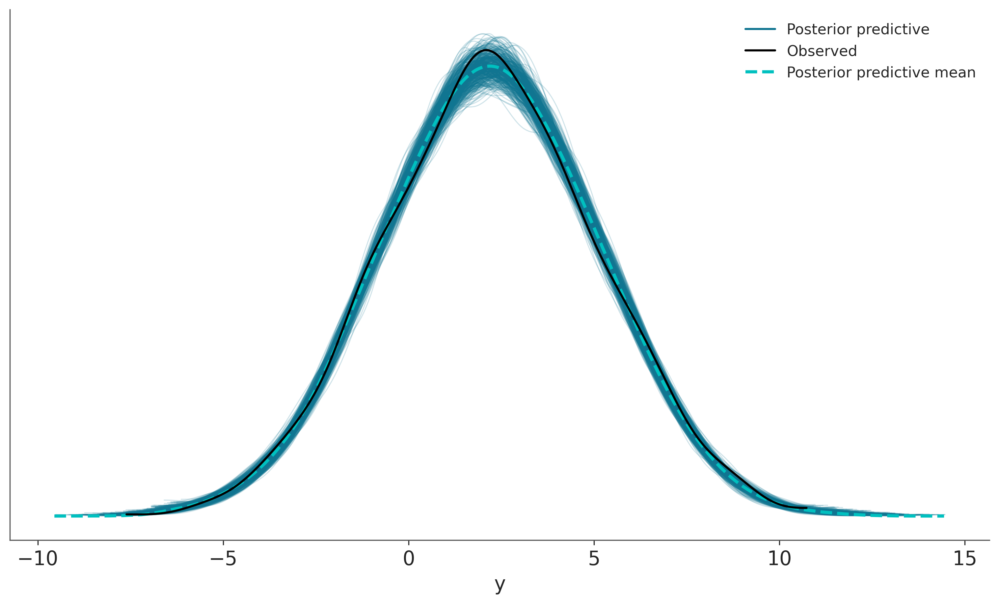

In [33]:
# Generate posterior predictive samples
ppc = model.predict(results, kind='response')

# Plot the posterior predictive checks
az.plot_ppc(results, num_pp_samples=500, figsize=(10, 6), kind='kde')
plt.show()